# from https://huggingface.co/spaces/deepghs/text_detection/blob/main/detect.py

In [24]:
# not needed
!git clone https://huggingface.co/deepghs/text_detection

Cloning into 'text_detection'...
remote: Enumerating objects: 78, done.
remote: Counting objects: 100% (74/74), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 78 (delta 35), reused 0 (delta 0), pack-reused 4
Unpacking objects: 100% (78/78), 399.04 KiB | 3.91 MiB/s, done.
Filtering content: 100% (7/7), 588.32 MiB | 9.77 MiB/s, done.


In [1]:
!pip install huggingface_hub dghs-imgutils hbutils>=0.9.1 opencv-python numpy 

In [9]:
!pip install pillow

In [1]:
import os.path
from functools import lru_cache
from typing import List, Tuple

import cv2
import numpy as np
from huggingface_hub import HfApi, HfFileSystem, hf_hub_download
from imgutils.data import ImageTyping
from imgutils.utils import open_onnx_model

hf_client = HfApi()
hf_fs = HfFileSystem()

/home/akos/Documents/GitHub/experiments/handwritten/text-detection/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [13]:
@lru_cache()
def _get_onnx_session(model):
    return open_onnx_model(hf_hub_download(
        'deepghs/text_detection',
        f'{model}/end2end.onnx'
    ))

In [3]:
def _get_heatmap_of_text(image: ImageTyping, model: str) -> np.ndarray:
    origin_width, origin_height = width, height = image.size
    align = 32
    if width % align != 0:
        width += (align - width % align)
    if height % align != 0:
        height += (align - height % align)

    input_ = np.array(image).transpose((2, 0, 1)).astype(np.float32) / 255.0
    # noinspection PyTypeChecker
    input_ = np.pad(input_[None, ...], ((0, 0), (0, 0), (0, height - origin_height), (0, width - origin_width)))

    def _normalize(data, mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711)):
        mean, std = np.asarray(mean), np.asarray(std)
        return (data - mean[None, :, None, None]) / std[None, :, None, None]

    ort = _get_onnx_session(model)

    input_ = _normalize(input_).astype(np.float32)
    output_, = ort.run(['output'], {'input': input_})
    heatmap = output_[0]
    heatmap = heatmap[:origin_height, :origin_width]

    return heatmap

In [4]:
def _get_bounding_box_of_text(image: ImageTyping, model: str, threshold: float) \
        -> List[Tuple[Tuple[int, int, int, int], float]]:
    heatmap = _get_heatmap_of_text(image, model)
    c_rets = cv2.findContours((heatmap * 255.0).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = c_rets[0] if len(c_rets) == 2 else c_rets[1]
    bboxes = []
    for c in contours:
        x, y, w, h = cv2.boundingRect(c)
        x0, y0, x1, y1 = x, y, x + w, y + h
        score = heatmap[y0:y1, x0:x1].mean().item()
        if score >= threshold:
            bboxes.append(((x0, y0, x1, y1), score))

    return bboxes

In [40]:
def detect_text(image: ImageTyping, model: str = "_DEFAULT_MODEL", threshold: float = 0.05, padding: int=1):
    bboxes = []
    for (x0, y0, x1, y1), score in _get_bounding_box_of_text(image, model, threshold):
        x0 = x0-padding
        y0 = y0-padding
        x1 = x1+padding
        y1 = y1+padding
        bboxes.append(((x0, y0, x1, y1), 'text', score))
    return bboxes

In [6]:
from imgutils.detect import detection_visualize
import cv2
from PIL import Image

In [44]:
import PIL.Image

image = PIL.Image.open("test.jpg")
model = "dbnet_resnet18_fpnc_1200e_totaltext"
threshold = 0.1 #detection treshold
padding = 15 # make bounding box bigger 

In [45]:
bounding_boxes = detect_text(image, model, threshold, padding)

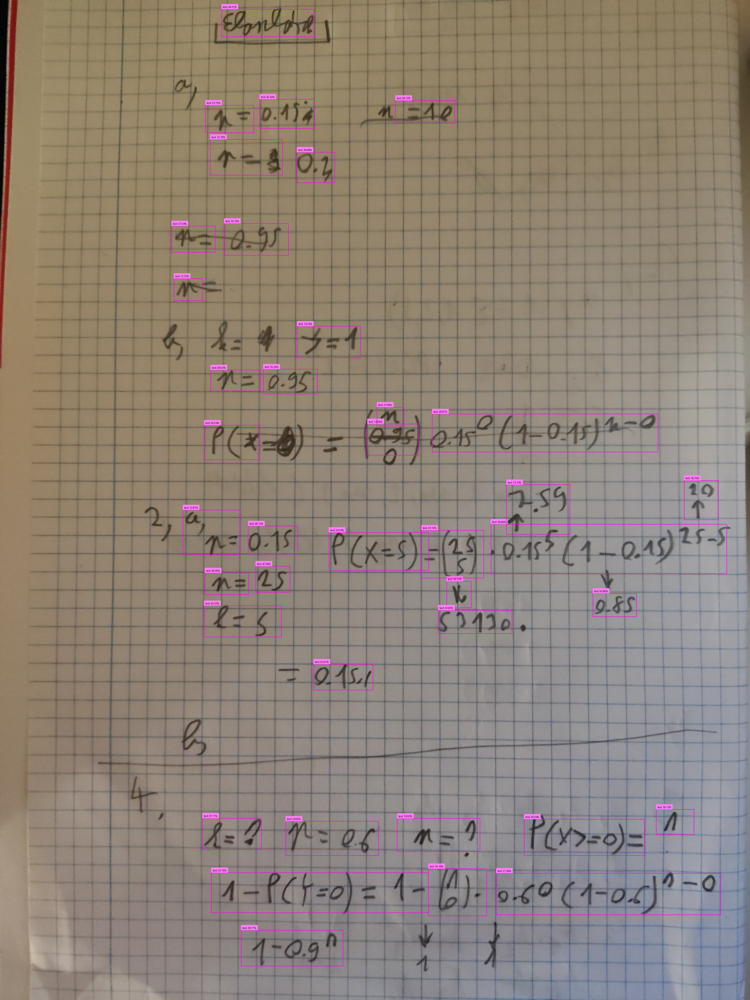

In [46]:
detection_visualize(image, bounding_boxes)